## Import packages

In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import os,sys
os.environ['SCIPY_ARRAY_API'] = '1'
from ALLCools.clustering import ConsensusClustering
from ALLCools.plot import plot_dendrogram
from pym3c.adata import MultiAdata,plot_cluster
from pym3c.utils import read_markers
import anndata
import matplotlib.pylab as plt
%matplotlib inline
import seaborn as sns
import warnings
from IPython.display import display, Markdown, Latex
warnings.filterwarnings("ignore")
import matplotlib as mpl
mpl.style.use('default')
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = 'Arial'

In [3]:
# Parameters
level = 2
parent_ct = "Splatter"
obs_cols = ["Region", "donor", "tech", "MajorType", "mCGFrac", "mCHFrac", "leiden"]
rootdir = "/home/x-wding2/Projects/BG/clustering/100kb"
metadata_path = "/home/x-wding2/Projects/BG/metadata/BG_metadata.tsv.gz"
mc_types = ["CGN", "CHN"]
pca_downsample = 100000
use_lsi = False
clip_norm_value = 10
max_value = None
with_mean = False
batch_col = ["Study", "tech", "donor"]
batch_correct_method = "harmony"
categorical_covariate_keys = None
n_layers = 1
std_cutoff = None
adata_path = ["~/Projects/BG/adata/BG.100kb-CGN.h5ad", "~/Projects/BG/adata/BG.100kb-CHN.h5ad"]
exclude_adata = None
gene_adata_path = "/home/x-wding2/Projects/BG/adata/BG.gene-C*N.h5ad"
exclude_gene_adata = None
cef_downsample = 500
top_n_enriched_features = 200
feature_type = "CEF"
alpha = 0.05
max_cell_prop = None
p_cutoff = 0.1
coord_base = "umap"
use_rep = "X_pca_harmony"
n_neighbors = None
metric = "euclidean"
min_cluster_size = 50
leiden_repeats = 200
leiden_resolution = 1
consensus_rate = 0.5
train_frac = 0.5
train_max_n = 1000
random_state = 0
max_iter = 50
n_jobs = 24
target_accuracy = 0.9
cor_method = "pearson"
linkage_method = "average"
marker_path = "/home/x-wding2/Projects/BG/metadata/BG_markers.xlsx"
marker_sheet = "BG"
marker_level = None
max_depth = None
palette_path = "/home/x-wding2/Projects/BG/metadata/BG_color_palette.xlsx"
clustering_name_annot = "Subclass"
final_mc_read_col = "UniqueAlignFinalReads"
score_key = "BG.gene-CHN"
param_yaml = "/home/x-wding2/Projects/Github/pym3c/pym3c/notebooks/clustering/BG_100kb.yaml"
kernel_name = "m3c"


In [4]:
rootdir=os.path.abspath(os.path.expanduser(rootdir))
assert os.path.exists(rootdir)
clustering_name=f"L{level}"
# if not os.path.exists(os.path.join(rootdir,"obs_with_cluster_id.tsv")):
#     run_clustering=True # run consensus clustering
#     cluster_col=clustering_name
# else:
#     run_clustering=False #cluster_id is already existed in obs_with_cluster_id.tsv (skip consensus clustering)
#     cluster_col='cluster_id'
run_clustering=True
cluster_col=clustering_name
if level == 1 or os.path.exists(os.path.join(rootdir,"obs_with_cluster_id.tsv")):
    run_annotation=True #added cell type scores using given marker genes
else:
    run_annotation=False # didn't calculate cell type score, only defined the cluster (iterative clustering)
if level > 1: #use metadata from previous round subtype.
    pre_clustering_name=f"L{level-1}"
    metadata_path=os.path.join(rootdir,pre_clustering_name,"data",f"{parent_ct}.metadata.txt")
print(metadata_path)
outdir=os.path.join(rootdir,clustering_name)
outdir=os.path.abspath(os.path.expanduser(outdir))
assert os.path.exists(outdir)
figdir=os.path.join(outdir,"figures")
datadir=os.path.join(outdir,"data")
if not os.path.exists(figdir):
    os.mkdir(figdir)
if not os.path.exists(datadir):
    os.mkdir(datadir)

if parent_ct is None:
    data_basename=os.path.join(datadir,f"{clustering_name}")
    fig_basename=os.path.join(figdir,f"{clustering_name}")
else:
    bname=f"{clustering_name}_{parent_ct}"
    data_basename=os.path.join(datadir,bname.replace(' ','_'))
    fig_basename=os.path.join(figdir,bname.replace(' ','_'))
input_adata_path=f"{data_basename}.concatenated_pcs.adata.h5ad"

if marker_level is None:
    marker_level=clustering_name_annot
if n_jobs is None or n_jobs==-1:
    n_jobs=os.cpu_count()
print(n_jobs)
basis=f"X_{coord_base}"

/home/x-wding2/Projects/BG/clustering/100kb/L1/data/Splatter.metadata.txt
24


## Read pre-cluster adata
The X of preclustered adata was emptied, X is fake. Need to read gene CG and CH adata and replace cluster_adata.X

In [8]:
print(input_adata_path)
adata = anndata.read_h5ad(input_adata_path) #adata.X is fake (all ones), do not use it.
adata

/home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.concatenated_pcs.adata.h5ad


AnnData object with n_obs × n_vars = 25409 × 1
    obs: 'InputReadPairs', 'InputReadPairsBP', 'TrimmedReadPairs', 'R1WithAdapters', 'R1QualTrimBP', 'R1TrimmedReadsBP', 'R2WithAdapters', 'R2QualTrimBP', 'R2TrimmedReadsBP', 'UniqueMappedReads', 'UniqueMappingRate', 'MultiMappedReads', 'MultiMappingRate', 'OverallMappingRate', 'R1UniqueMappedReads', 'R1MultiMappedReads', 'R1UniqueMappingRate', 'R1MultiMappingRate', 'R1OverallMappingRate', 'R2UniqueMappedReads', 'R2MultiMappedReads', 'R2UniqueMappingRate', 'R2MultiMappingRate', 'R2OverallMappingRate', 'UniqueAlignFinalReads', 'UniqueAlignDuplicatedReads', 'UniqueAlignPCRDuplicationRate', 'CisContacts', 'CisCutContacts', 'CisMultiContacts', 'CisCutMultiContacts', 'TransContacts', 'TransCutContacts', 'TransMultiContacts', 'TransCutMultiContacts', 'ChimericContacts', 'NoContacts', 'MappedFragments', 'DeduppedContacts', 'ContactsDeduplicationRate', 'TotalCisContacts', 'TotalTransContacts', 'TotalMultiContacts', 'CisContactsRatio', 'TransContac

## Consensus Clustering

Computing nearest neighbor graph
Computing multiple clustering with different random seeds
Repeating leiden clustering 200 times
Found 47 - 53 clusters, mean 50.3, std 1.04
Summarizing multiple clustering results
25397 cells assigned to 51 raw clusters
12 cells are multi-leiden outliers

=== Start supervise model training and cluster merging ===

=== iteration 1 ===
51 non-outlier labels
Balanced accuracy on the training set: 0.982
Balanced accuracy on the hold-out set: 0.968
Stop iteration because current accuracy 0.968 > target accuracy 0.900.

=== Assign final labels ===
Assigned all the multi-leiden clustering outliers into clusters using the prediction model from final clustering version.
Final ten-fold CV Accuracy on all the cells: 0.972
52 51


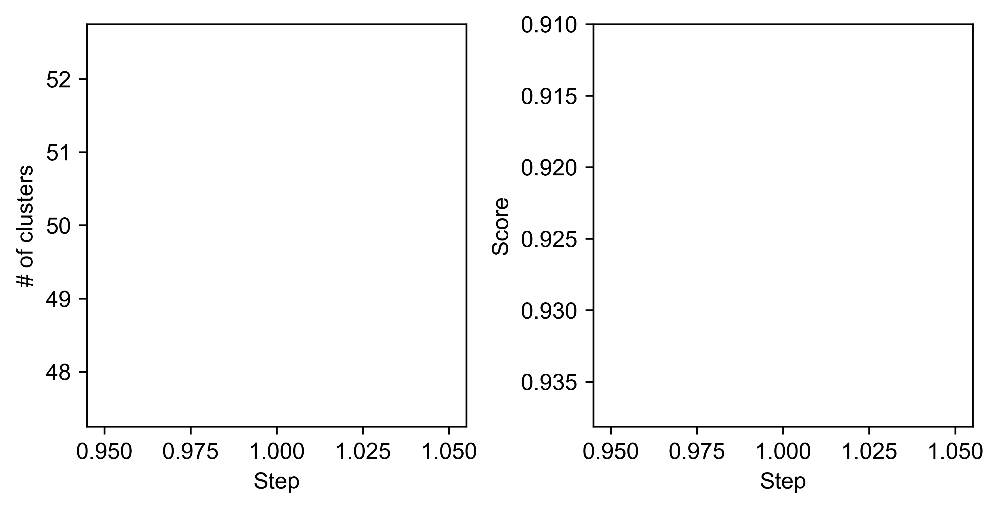

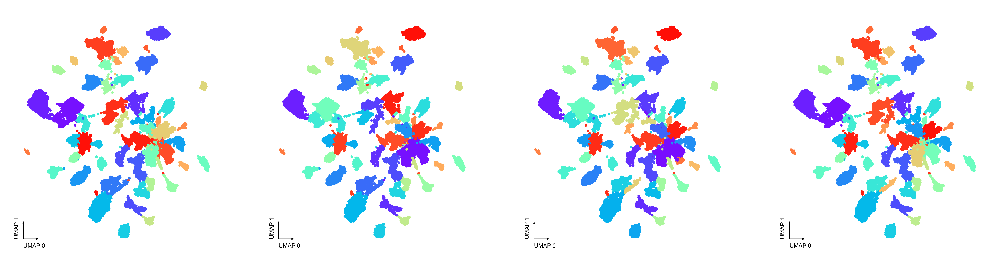

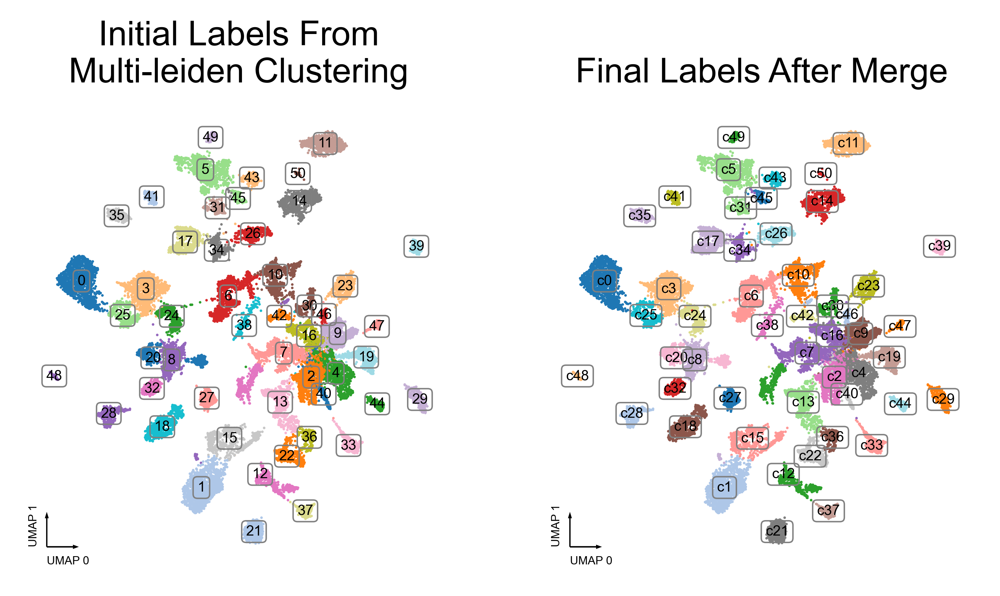

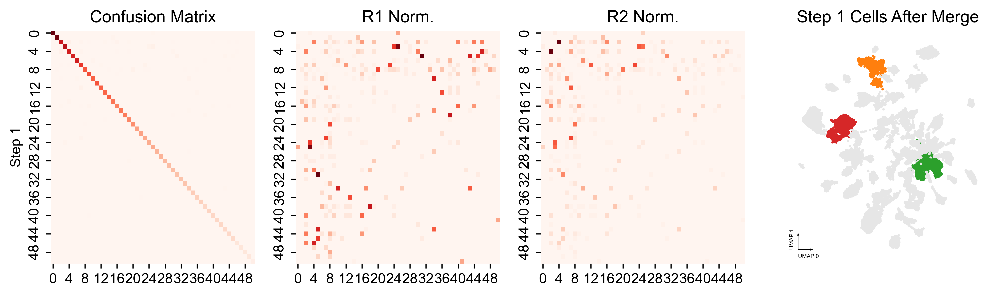

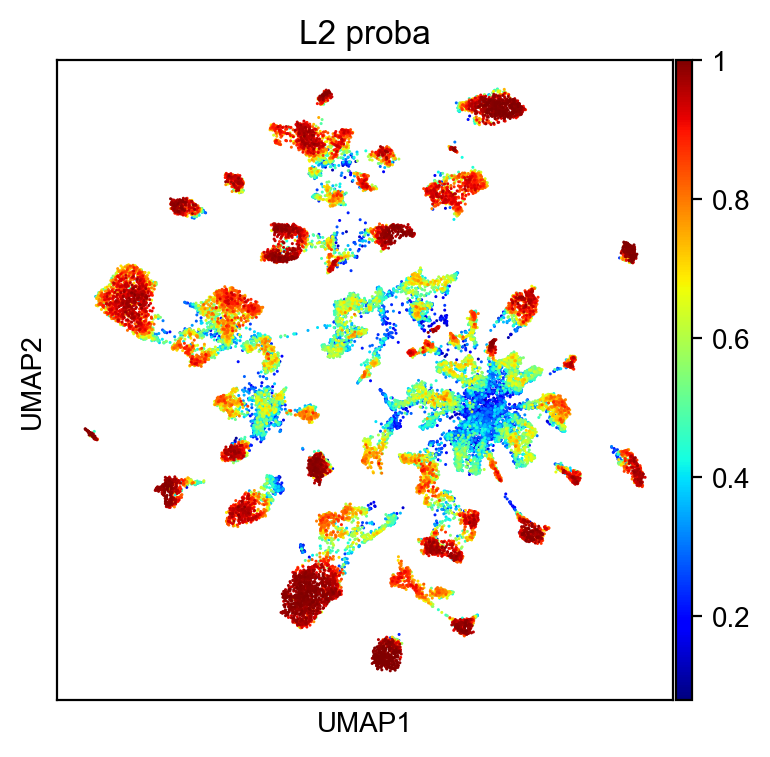

cell
UCI5224_CX19202223_CaT_1_P12-5-P11-C22         c3
UWA7648_CX21_GP_1_P8-1-G10-E22                 c8
UWA7648_CX2324_SubTH_1_P8-1-I15-I12            c1
UCI2424_CX17_GP_1_P8-1-F12-K11                 c1
HBA_220324_H1930002_CX56_NAC_1_P5-2-I24-K4    c14
Name: L2, dtype: category
Categories (51, object): ['c0', 'c1', 'c2', 'c3', ..., 'c47', 'c48', 'c49', 'c50']
L2


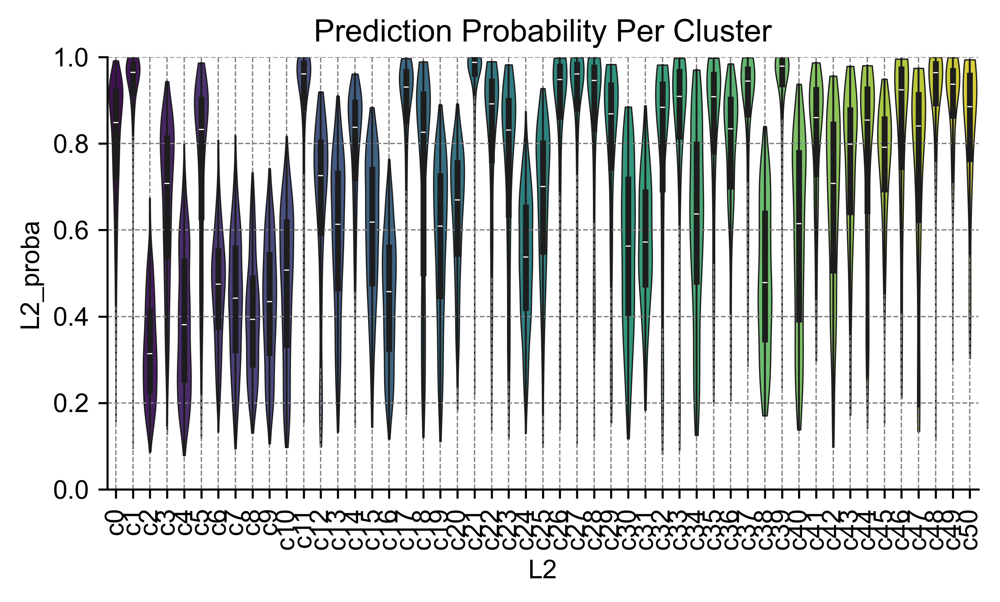

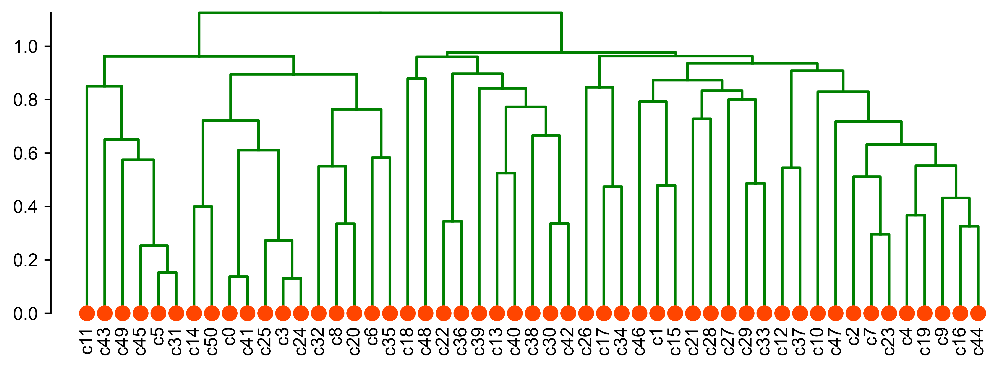

In [9]:
if run_clustering:
    if n_neighbors is None:
        n_neighbors = max(25, int(np.log2(adata.shape[0])*2))
    cc = ConsensusClustering(model=None,
                             n_neighbors=n_neighbors,
                             metric=metric,
                             min_cluster_size=min_cluster_size,
                             leiden_repeats=leiden_repeats,
                             leiden_resolution=leiden_resolution,
                             consensus_rate=consensus_rate,
                             random_state=random_state,
                             train_frac=train_frac,
                             train_max_n=train_max_n,
                             max_iter=max_iter,
                             n_jobs=n_jobs,
                             target_accuracy=target_accuracy)

    cc.fit_predict(adata.obsm[use_rep]) #X_pca, X_scVI, X_pca_harmony or X_pca_seurat and so on.

    adata.obs[f'{coord_base}_0'] = adata.obsm[basis][:, 0]
    adata.obs[f'{coord_base}_1'] = adata.obsm[basis][:, 1]
    cc.plot_merge_process(plot_size=3)
    cc.plot_leiden_cases(coord_data=adata.obs,coord_base=coord_base) #Show some leiden runs with the biggest different as measured by ARI

    adata.obs[clustering_name] = cc.label #list of length n_cell
    print(len(set(cc._multi_leiden_clusters)), len(set(cc.label)))
    cc.plot_steps(coord_data=adata.obs, coord_base=coord_base) #Plot the supervised learning and merge steps

    adata.obs[clustering_name + '_proba'] = cc.label_proba

    with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
        sc.pl.scatter(adata,#ax=ax,
                  basis=coord_base, #x='tsne_0',y='tsne_1',
                  color=clustering_name + '_proba',
                 color_map='jet') #legend_loc='on data', basis is one of 'pca', 'tsne', 'umap', 'diffmap', 'draw_graph_fr']

    fig, ax = plt.subplots(figsize=(6, 3), dpi=300)

    sns.violinplot(data=adata.obs,x=clustering_name,
                   y=clustering_name + '_proba',
                   scale='width',linewidth=0.5,cut=0,ax=ax,
                   palette=sns.color_palette("viridis", n_colors=adata.obs[clustering_name].nunique()))
    ax.set(ylim=(0, 1), title='Prediction Probability Per Cluster')
    ax.xaxis.set_tick_params(rotation=90)
    ax.grid(linewidth=0.5, color='gray', linestyle='--')
    sns.despine(ax=ax)

    if len(adata.obs[clustering_name].unique())>1:
        adata.obs[clustering_name] = adata.obs[clustering_name].astype('category')
        sc.tl.dendrogram(adata, groupby=clustering_name,
                         n_pcs=adata.obsm[use_rep].shape[1],use_rep=use_rep,
                        cor_method=cor_method,linkage_method=linkage_method
                        )

        fig, ax = plt.subplots(figsize=(9, 3), dpi=300)
        _ = plot_dendrogram(dendro=adata.uns[f'dendrogram_{clustering_name}']['dendrogram_info'],
                            linkage_df=pd.DataFrame(adata.uns[f'dendrogram_{clustering_name}']['linkage']),
                            ax=ax,edge_color='green',marker_color='orangered',node_size_norm=True,
                            plot_non_singleton=False,)

    cc.save(f'{data_basename}.cc.model.lib')
    # dendro.save(f'{clustering_name}.Dendrogram.lib')
    # else:
    #     adata.obs[clustering_name]=adata.obs['leiden'].apply(lambda x:f"c{x}")
    print(adata.obs[clustering_name].head())

print(clustering_name)

In [10]:
# uid={plate}-{multiplex_group}-{primer_name}
# cell_id = uid-index_name = {plate}-{multiplex_group}-{primer_name}-{index_name}
# UniqueAlignFinalReads equal to FinalmCReads
if not final_mc_read_col is None:
    if 'log2PlateNormCov' not in adata.obs.columns:
        adata.obs['Plate']=adata.obs.index.to_series().apply(lambda x:x.split('-')[0])
        plate_avg_read_dict=adata.obs.groupby('Plate')[final_mc_read_col].mean().to_dict()
        # plate normalized cell coverage (PNCC), refer to 2023 hanqing's paper
        adata.obs['PlateNormCov']=adata.obs.apply(lambda x:x[final_mc_read_col] / plate_avg_read_dict[x['Plate']],axis=1)
        adata.obs['log2PlateNormCov'] = np.log2(adata.obs['PlateNormCov'])

    # adata.obs['is_doublet']=adata.obs.log2PlateNormCov.apply(lambda x:True if abs(x) > 0.8 else False)
    adata.obs['is_doublet']=adata.obs.PlateNormCov.apply(lambda x:1 if x > 1.2 or x < 0.8 else 0)
    print(adata.obs['is_doublet'].value_counts())

is_doublet
0    15080
1    10329
Name: count, dtype: int64


In [11]:
if not final_mc_read_col is None:
    doublet_percent=(adata.obs.groupby(cluster_col)['is_doublet'].sum() / adata.obs[cluster_col].value_counts()) * 100
    doublet_percent.sort_values(ascending=False,inplace=True)
    print(doublet_percent)

L2
c27    52.646240
c8     50.000000
c20    48.923679
c21    48.379630
c26    46.111111
         ...    
c32    33.676976
c10    32.926829
c42    32.195122
c6     31.717172
c24    29.629630
Length: 51, dtype: float64


In [ ]:
if not final_mc_read_col is None:
    with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
        for embedding in ['tsne','umap']:
            print(embedding)
            if f"X_{embedding}" not in adata.obsm:
                continue
            plt.figure()
            sc.pl.embedding(adata,basis=f"X_{embedding}", color=['mCGFrac','mCHFrac','log2PlateNormCov','is_doublet'],cmap='jet',ncols=2,wspace=0.3,show=False,vmin='p5',vmax='p95')
            plt.savefig(f"{fig_basename}.mCFrac.{embedding}.pdf",bbox_inches='tight',dpi=300)
            plt.show()

## Visualization

In [ ]:
use_cols=obs_cols+[cluster_col] if adata.obs[cluster_col].nunique() < 50 else obs_cols
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    plt.figure()
    sc.pl.embedding(adata,basis=basis,color=use_cols,cmap='jet',
           ncols=2,wspace=0.6,show=False,vmin='p5',vmax='p95') #Non-Neuron cells have low global mCH fraction.
    plt.savefig(f"{fig_basename}.summary.{coord_base}.pdf",bbox_inches='tight',dpi=300)
    plt.show()

In [14]:
if cluster_col in use_cols:
    colors={cluster:color for cluster,color in zip(adata.obs[cluster_col].cat.categories.tolist(),adata.uns[f'{cluster_col}_colors'])}
    plot_cluster(adata_path=adata,coord_base=coord_base,
                 cluster_col=cluster_col,
                 coding=False,palette_path=colors,
                 output=f"{fig_basename}.annotated.{coord_base}.{cluster_col}.pdf")

In [15]:
adata.strings_to_categoricals()
adata.write_h5ad(f'{data_basename}.ConsensusClustering.adata.h5ad')
adata.obs.to_csv(f"{data_basename}.obs.tsv",sep='\t')
adata.obs

,InputReadPairs,InputReadPairsBP,TrimmedReadPairs,R1WithAdapters,R1QualTrimBP,R1TrimmedReadsBP,R2WithAdapters,R2QualTrimBP,R2TrimmedReadsBP,UniqueMappedReads,...,log2PlateNormCov,is_doublet,Nonneuron_score,Glut_score,Subpallium GABA_score,cluster_id,Class_HMBA,code_Class_HMBA,L2,L2_proba
cell,,,,,,,,,,,,,,,,,,,,,
UCI5224_CX19202223_CaT_1_P12-5-P11-C22,833973,253527792,831172,129292,500211,100148286,124896,809069,106778968,886552.0,...,-0.234542,0,-0.059433,0.265937,0.935253,c16+c6+c0,CN CGE GABA,1: CN CGE GABA,c3,0.629450
UWA7648_CX21_GP_1_P8-1-G10-E22,3129842,951471968,3123487,55517,1843601,395878524,58180,2726825,419753770,3445359.0,...,0.209924,0,0.045589,0.472631,1.345610,c6+c0+c0+c0,F M GABA,6: F M GABA,c8,0.268033
UWA7648_CX2324_SubTH_1_P8-1-I15-I12,1223919,372071376,1223538,13978,571574,155516083,14876,767744,165068200,1309251.0,...,-0.537617,1,0.116858,-0.064128,0.118634,c20+c5+c0,F M Glut,7: F M Glut,c1,0.948833
UCI2424_CX17_GP_1_P8-1-F12-K11,2898059,881009936,2896367,67203,1771044,366494280,68498,2487012,388790906,3271021.0,...,0.492136,1,0.202073,-0.003104,0.359847,c20+c4+c0,F M Glut,7: F M Glut,c1,0.778867
HBA_220324_H1930002_CX56_NAC_1_P5-2-I24-K4,1786012,540113029,1785569,301,407541,226848813,1032,463516,240902226,2026327.0,...,-0.133497,0,0.046628,-0.000549,0.203838,c6+c9+c3+c0,CN MGE GABA,4: CN MGE GABA,c14,0.840833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
uwa7648_bs0102_mgm1_2_p15-1-l3-K23,2218402,674394208,2216876,46381,1029214,281249281,49383,1451016,298321219,2373091.0,...,-0.544895,1,-0.058263,-0.125212,0.930712,c25+c0+c0,F M Glut,7: F M Glut,c21,0.898052
UCI2424_CX17_GP_1_P16-1-C18-C17,1937271,588930384,1933351,55632,1311167,244163196,56573,1962005,258838977,2079677.0,...,-0.030056,0,0.001734,0.233839,-0.415905,c16+c1+c0+c0,CN CGE GABA,1: CN CGE GABA,c0,0.931000
UWA7648_CX21_GP_1_P6-1-I2-L10,2635103,801071312,2632082,45031,1741235,333408164,46178,2359116,353746183,2962714.0,...,-0.018003,0,0.053536,0.051986,-0.006051,c6+c7+c3,F M Glut,7: F M Glut,c18,0.812771


## Read markers

In [ ]:
if run_annotation:
    df_marker=read_markers(
        marker_path,marker_sheet,
        max_depth,marker_level,parent_ct,
        species,marker_cols = ['RNA_markers', 'Methylation_markers']
    )
else:
    df_marker=None
df_marker

## Add other gene adatas (multi adata)

In [6]:
# adata=anndata.read_h5ad(f'{data_basename}.ConsensusClustering.adata.h5ad')
# adata

### Calculate cell type score using marker genes

In [6]:
if run_annotation:
    madata=MultiAdata(
        adata_path=gene_adata_path,exclude=exclude_gene_adata,
        metadata_path=metadata_path)
    print(score_key)
    cell_types=df_marker.CellType.dropna().unique().tolist()

BG.gene-CHN adata.shape: (265428, 37979) PCA shape: (265428, 64)
BG.gene-CGN adata.shape: (265428, 37979) PCA shape: (265428, 49)
n_obs: 25409
BG.gene-CHN


In [ ]:
if run_annotation:
    cell_types=df_marker.CellType.dropna().unique().tolist()
    for celltype in cell_types:
        print(celltype)
        markers=df_marker.loc[df_marker.CellType==celltype].Markers.tolist()[0]
        if len(markers)==0:
            continue
        if f"{celltype}_score" in adata.obs.columns:
            continue
        try:
            df=madata.score_genes(markers,keys=score_key,normalize_per_cell=True)
        except:
            continue
        # for col in df.columns.tolist():
        #     adata.obs[f"{celltype}.{col}"]=df.loc[adata.obs_names,col].tolist()
        adata.obs[f"{celltype}_score"]=df.loc[adata.obs_names,score_key].tolist()
print(adata.obs.head())

In [8]:
# add neuronal activity score
genes="Arc,Btg2,Coq10b,Crem,Dusp1,Dusp5,Egr1,Egr3,Fbxo33,Fos,Fosl2,Gadd45g,Gmeb2,Grasp,Junb,Nr4a1,Nr4a2,Nr4a3,Per1,Rgs2,Sertad1,Tiparp".split(',')
markers=[gene.upper() for gene in genes]
print(markers)
df=madata.score_genes(markers,keys='BG.gene-CHN',normalize_per_cell=True)
adata.obs["neuronal_activity_score"]=df.loc[adata.obs_names,'BG.gene-CHN'].tolist()
adata.write_h5ad(f'{data_basename}.ConsensusClustering.WithScores.adata.h5ad')

['ARC', 'BTG2', 'COQ10B', 'CREM', 'DUSP1', 'DUSP5', 'EGR1', 'EGR3', 'FBXO33', 'FOS', 'FOSL2', 'GADD45G', 'GMEB2', 'GRASP', 'JUNB', 'NR4A1', 'NR4A2', 'NR4A3', 'PER1', 'RGS2', 'SERTAD1', 'TIPARP']
Normalizing cell level fraction by alpha and beta (prior_mean)


In [ ]:
plt.figure()
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata,basis=basis,color=['mCGFrac','mCHFrac','neuronal_activity_score'], 
               wspace=0.2,ncols=3,show=False,
               legend_loc='on data',
               vmin='p5',vmax='p95',
               cmap='jet' #vcenter='p50'
              )
# plt.savefig(f"{fig_basename}.{celltype}.{key}.markers.{coord_base}.pdf",bbox_inches='tight',dpi=300)
plt.show()

In [ ]:
if run_annotation:
    score_cols = [f"{celltype}_score" for celltype in cell_types]
    for embedding in ['tsne','umap']:
        if f"X_{embedding}" not in adata.obsm:
            continue
        print(embedding)
        plt.figure()
        with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
            sc.pl.embedding(
                    adata,basis=f"X_{embedding}",
                    color=[cluster_col,'mCGFrac','mCHFrac']+score_cols, #gene_symbols='gene_name',
                   wspace=0.2,ncols=3,show=False,
                   legend_loc='on data',use_raw=False,
                   vmin='p5',vmax='p95',
                   cmap='jet' #vcenter='p50'
                      )
        plt.savefig(f"{fig_basename}.auto_ann.{embedding}.pdf",bbox_inches='tight',dpi=300)
        plt.show()

    output_adata=f'{data_basename}.ConsensusClustering.WithScores.adata.h5ad'
    # save adata
    adata.strings_to_categoricals()
    adata.write_h5ad(output_adata)
    adata.obs.to_csv(f"{data_basename}.obs.tsv",sep='\t')
    print(output_adata)

In [9]:
adata=anndata.read_h5ad(f'{data_basename}.ConsensusClustering.WithScores.adata.h5ad')
adata

AnnData object with n_obs × n_vars = 25409 × 1
    obs: 'InputReadPairs', 'InputReadPairsBP', 'TrimmedReadPairs', 'R1WithAdapters', 'R1QualTrimBP', 'R1TrimmedReadsBP', 'R2WithAdapters', 'R2QualTrimBP', 'R2TrimmedReadsBP', 'UniqueMappedReads', 'UniqueMappingRate', 'MultiMappedReads', 'MultiMappingRate', 'OverallMappingRate', 'R1UniqueMappedReads', 'R1MultiMappedReads', 'R1UniqueMappingRate', 'R1MultiMappingRate', 'R1OverallMappingRate', 'R2UniqueMappedReads', 'R2MultiMappedReads', 'R2UniqueMappingRate', 'R2MultiMappingRate', 'R2OverallMappingRate', 'UniqueAlignFinalReads', 'UniqueAlignDuplicatedReads', 'UniqueAlignPCRDuplicationRate', 'CisContacts', 'CisCutContacts', 'CisMultiContacts', 'CisCutMultiContacts', 'TransContacts', 'TransCutContacts', 'TransMultiContacts', 'TransCutMultiContacts', 'ChimericContacts', 'NoContacts', 'MappedFragments', 'DeduppedContacts', 'ContactsDeduplicationRate', 'TotalCisContacts', 'TotalTransContacts', 'TotalMultiContacts', 'CisContactsRatio', 'TransContac

<Figure size 320x320 with 0 Axes>

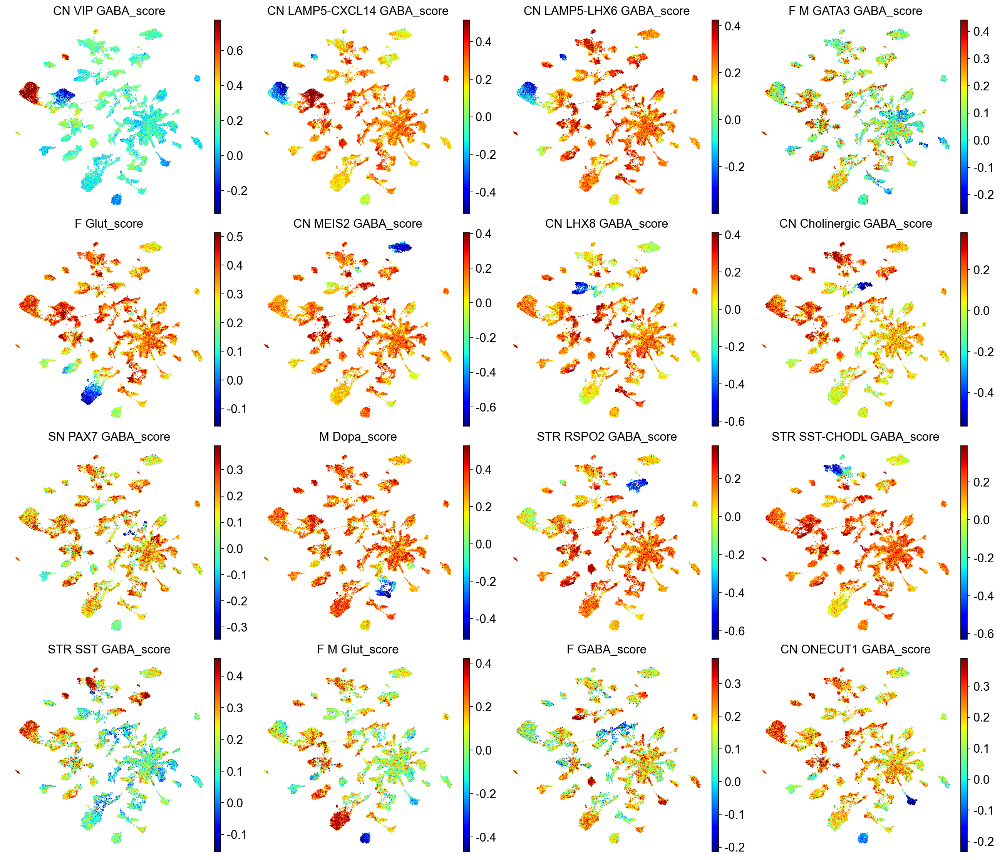

In [24]:
cell_types=df_marker.CellType.dropna().unique().tolist()
score_cols = [f"{celltype}_score" for celltype in cell_types if f"{celltype}_score" in adata.obs.columns.tolist()]
embedding='umap'
sc.set_figure_params(vector_friendly=True, dpi_save=100)
plt.figure()
with plt.rc_context({"figure.figsize": (4.5, 4), "figure.dpi": (80), 'savefig.dpi':(100)}):
    sc.pl.embedding(
        adata,basis=f"X_{embedding}",
        color=score_cols,wspace=0.1,hspace=0.1,ncols=4,show=False,frameon=False,
        legend_loc='on data',vmin='p1',vmax='p99',cmap='jet', 
              )
plt.savefig(f"{fig_basename}.auto_ann.{embedding}.pdf",bbox_inches='tight',dpi=100)
plt.show()

## Plot markers

In [22]:
# df_marker1=df_marker.loc[:,['Level','CellType','Markers']]
# ct_generator=iter(df_marker1.CellType.tolist())
# df_marker1

In [23]:
# try:
#     celltype=next(ct_generator)
#     print(celltype)
# except StopIteration:
#     print("finished")

Normalizing cell level fraction by alpha and beta (prior_mean)
['MEIS2', 'TH', 'LAMP5', 'CXCL14', 'LHX6', 'ONECUT1', 'VIP', 'GATA3', 'PAX7', 'RSPO2', 'SST', 'CHODL']


<Figure size 320x320 with 0 Axes>

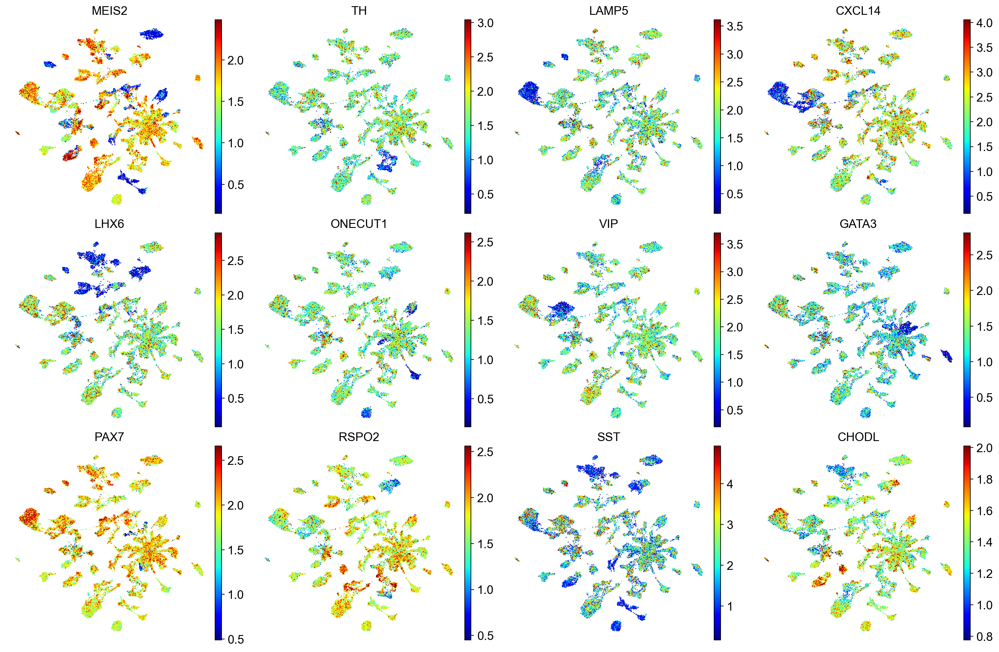

In [28]:
markers=['MEIS2', 'TH', 'LAMP5', 'CXCL14', 'LHX6', 'ONECUT1', 'VIP', 'GATA3', 'PAX7', 'RSPO2', 'SST', 'CHODL']
color=[] #if level == 1 else [cluster_col,'L1','mCHFrac']
use_adata=madata.get_adata(score_key,markers,adata,normalize_per_cell=True)
cols=adata.obs.columns.tolist()
for col in cols:
    use_adata.obs[col]=use_adata.obs_names.map(adata.obs[col].to_dict())
keep_markers=[]
for m in markers:
    if m in use_adata.var_names:
        keep_markers.append(m)
    else:
        print(m)
print(keep_markers)
sc.set_figure_params(vector_friendly=True, dpi_save=100)
plt.figure()
with plt.rc_context({"figure.figsize": (4.5, 4), "figure.dpi": (100)}):
    sc.pl.embedding(use_adata,basis=basis,color=color+keep_markers, #gene_symbols='gene_name',
               wspace=0.1,hspace=0.1,ncols=4,show=False,frameon=False,
               legend_loc='on data',
               vmin='p1',vmax='p99',
               cmap='jet' #vcenter='p50'
              )
plt.savefig(f"{fig_basename}.{score_key}.markers.{coord_base}.pdf",bbox_inches='tight',dpi=100)
plt.show()

In [48]:
# from pym3c.adata import plot_gene
# for gene in ['SLC22A10', 'BCL11B', 'ACTN2', 'GDA',]: #['SKOR1','PVALB','PITX2']: #keep_markers:
#     print(gene)
#     plot_gene(
#     	adata_path="~/Projects/BG/adata/BG.gene-CHN.h5ad",
#     	group_col='L2',gene=gene,query_str=None,
#     	palette_path=None,
#     	obsm=adata,coord_base='umap',normalize_per_cell=True)

In [25]:
# display(Markdown(f'### {celltype}'))
# level,celltype,markers=df_marker1.loc[df_marker1.CellType==celltype].values.tolist()[0]
# print(level)
# print(markers)
# 
# color=[cluster_col,'mCHFrac'] if level == 1 else [cluster_col,'L1','mCHFrac']
# if len(markers)>0:
#     for key in madata.get_keys():
#         if key != score_key:
#             continue
#         display(Markdown(f'#### {key}'))
#         use_adata=madata.get_adata(key,markers,adata,normalize_per_cell=True)
#         keep_markers=[]
#         for m in markers:
#             if m in use_adata.var_names:
#                 keep_markers.append(m)
#             else:
#                 print(m)
#         print(f"'{celltype}':",keep_markers)
#         plt.figure()
#         with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
#             sc.pl.embedding(use_adata,basis=basis,color=color+keep_markers, #gene_symbols='gene_name',wspace=0.2,ncols=3,show=False,
#                        legend_loc='on data',
#                        vmin='p5',vmax='p95',
#                        cmap='jet' #vcenter='p50'
#                       )
#         # plt.savefig(f"{fig_basename}.{celltype}.{key}.markers.{coord_base}.pdf",bbox_inches='tight',dpi=300)
#         plt.show()

In [26]:
# with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
#     for ct in selected_ct_markers:
#         genes=selected_ct_markers[ct]
#         use_genes=list(set(genes) & set(adata.var_names))
#         print(ct,use_genes)
#         plt.figure()
#         sc.pl.embedding(adata,basis=basis,color=[clustering_name_annot]+use_genes,
#                    wspace=0.3,ncols=3,show=False,#layer='gene_CG',
#                    use_raw=False,#legend_loc='on data',#colorbar_loc=None,
#                    vmin='p5',vmax='p95',#vcenter='p50',#cmap='jet',
#                   )
#         plt.savefig(f"{fig_basename}.annotated.{ct.replace('/','_')}.gene_CH.markers.{coord_base}.pdf",bbox_inches='tight',dpi=300)
#         plt.show()

## Differentially methylated genes

In [ ]:
use_adata=madata.madata[score_key][adata.obs_names,:].to_memory()
cols=adata.obs.columns.tolist()
for col in cols:
    use_adata.obs[col]=use_adata.obs_names.map(adata.obs[col].to_dict())
sc.tl.rank_genes_groups(use_adata,groupby=cluster_col,use_raw=False,#groups=['c8','c24'],
                        method="wilcoxon",key_added='rank_genes_groups') #method='t-test','wilcoxon',key_added='rank_genes_groups'
sc.pl.rank_genes_groups_dotplot(
    use_adata, groupby=cluster_col, standard_scale="var", n_genes=-5,cmap='bwr',
    values_to_plot='scores',
    key='rank_genes_groups'
)

sc.pl.rank_genes_groups_matrixplot(use_adata,groupby=cluster_col,
                                   values_to_plot='scores',
                                   cmap='bwr') #sc.pl.matrixplot,values_to_plot='scores',logfoldchanges

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    use_adata, groupby=cluster_col, standard_scale="var", n_genes=-5,cmap='bwr',
    values_to_plot='scores',groups=['c8','c24'],
    key='rank_genes_groups'
)

In [28]:
# with plt.rc_context({"figure.figsize": (3.5, 7), "figure.dpi": (200)}):
#     sc.pl.rank_genes_groups_dotplot(
#         adata, groupby=cluster_col,cmap='coolwarm',standard_scale='var',
#         values_to_plot='scores',var_names=[m for m in df_marker.Markers.sum() if m in adata.var_names],expression_cutoff=0.5,
#         swap_axes=True,layer='promoter_CG')

In [29]:
# markers = sc.get.rank_genes_groups_df(use_adata, group=use_adata.obs[cluster_col].unique(),key='rank_genes_groups')
# markers=markers.loc[~ markers.names.isna()]
# markers=markers.loc[(~ markers.logfoldchanges.isna()) & (markers.scores < 0) & (markers.pvals < 0.05)]
# markers.sort_values('logfoldchanges',ascending=True,inplace=True)
# mc_features= markers.groupby('group').apply(lambda x:x.head(20).names.tolist()).sum()
# print(len(mc_features),mc_features[:10])
# markers